# Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.templates.default = "plotly_white"


from plotly.subplots import make_subplots
import seaborn as sns

%matplotlib inline
import matplotlib.pyplot as plt

import ipywidgets as widgets
from ipywidgets import interactive
from IPython.display import Audio, display

# filter warnings
import warnings
warnings.filterwarnings("ignore")

# Data

In [32]:
df = pd.read_csv('https://cnecovid.isciii.es/covid19/resources/casos_hosp_uci_def_sexo_edad_provres.csv', parse_dates=['fecha'], encoding='latin-1', keep_default_na=False)
df['sexo'] = df['sexo'].replace(['H', 'M'], ['Hombres', 'Mujeres'])
df.head(3)

,provincia_iso,sexo,grupo_edad,fecha,num_casos,num_hosp,num_uci,num_def
0,A,Hombres,0-9,2020-01-01,0,0,0,0
1,A,Hombres,10-19,2020-01-01,0,0,0,0
2,A,Hombres,20-29,2020-01-01,0,0,0,0


In [33]:
# select df from 2020-01-01 to 2020-06-30
df_S1_2020 = df[(df['fecha'] >= '2020-01-01') & (df['fecha'] <= '2020-06-30')]
df_S1_2020 = df_S1_2020[df_S1_2020['num_casos'].ne(0)]

# get first fecha of first nonzero num_casos occurence of each provincia_iso
df_S1_2020_first_occurence_prov = df_S1_2020[df_S1_2020['num_casos'].ne(0)].groupby('provincia_iso').first()['fecha'].reset_index()

# plot first occurecence per province
px.scatter(df_S1_2020_first_occurence_prov, x='fecha', y ='provincia_iso', title='Primer caso COVID-19 por provincia')

In [34]:
# iso codes
iso_path = 'D:/MUMOMA/TFM/COVID/COVID-Dynamics-Model-Comparison/data/raw-data/provinces_es_iso.csv'
iso = pd.read_csv(iso_path, keep_default_na=False)
iso = iso[['code', 'name']]
iso['name'].replace('Nafarroa', 'Navarra', inplace=True)

# df = df[(df['sexo']!='NC')&(df['grupo_edad']!='NC')&(df['provincia_iso']!='NC')]
df = df.merge(iso, left_on='provincia_iso', right_on='code', how='left')
df.drop(columns=['code'], inplace=True)

df.rename(columns={'sexo':'Sexo', 'grupo_edad':'Edad', 'name':'Provincias'}, inplace=True)

df['Año'] = df['fecha'].dt.year

In [35]:
population_path = 'D:/MUMOMA/TFM/COVID/COVID-Dynamics-Model-Comparison/data/processed-data/ine-population-processed-2022-05-10_202728.csv'
population = pd.read_csv(population_path, encoding='latin-1')
population = population.merge(iso, left_on='Provincias', right_on='name', how='left')
population.drop(columns=['name'], inplace=True)
population.rename(columns={'code':'provincia_iso'}, inplace=True)
population.head()

,Provincias,Sexo,Edad,Año,Total,Mes,provincia_iso
0,Albacete,Hombres,0-9,2021,17457,7,AB
1,Albacete,Hombres,10-19,2021,21018,7,AB
2,Albacete,Hombres,20-29,2021,22477,7,AB
3,Albacete,Hombres,30-39,2021,24701,7,AB
4,Albacete,Hombres,40-49,2021,31092,7,AB


In [36]:
spain_df = df.groupby(by=['fecha']).sum()

# smooth data 
spain_df = spain_df.rolling(window=7).mean().dropna().astype(int)

# Analysis

## Spain evolution 
- Daily number of new confirmed cases 
- Hospital and UCI cases
- Deaths

In [37]:
def read_process_who_hosp_uci_data():    
    df_who = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/hospitalizations/covid-hospitalizations.csv')
    # select spain data
    df_who = df_who[df_who['entity'] == 'Spain']
    df_who.drop(columns=['entity', 'iso_code'], inplace=True)
    # filter data by indicator 'Daily hospital occupancy' and 'Daily ICU occupancy'
    df_who = df_who[(df_who['indicator'] == 'Daily hospital occupancy')|(df_who['indicator'] == 'Daily ICU occupancy')]
    df_who = df_who.groupby(['indicator', 'date']).sum()
    df_who = df_who.unstack(level=0)
    df_who = df_who.reset_index()
    df_who.columns = df_who.columns.droplevel(0)
    df_who.rename(columns={'':'date'}, inplace=True)
    df_who.set_index(['date'], inplace=True)
    return df_who

df_who = read_process_who_hosp_uci_data()

In [38]:
def plot_new_cases_spain():
    fig = go.Figure()
    #plot selected data (by province or total spain data)
    fig.add_trace(go.Scatter(x=spain_df.dropna().index, y=spain_df['num_casos'].dropna().astype(int), name='Nuevos casos confirmados', 
        fill='tozeroy'))

    fig.update_layout(title_text="Casos nuevos de COVID en España")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Fecha')

    fig.update_traces(hovertemplate=None)
    fig.update_layout(hovermode='x unified')

    fig.update_layout(
        autosize=False,
        width=800,
        height=600,
    )
    fig.show()

def plot_hospital_uci_cases_spain():
    fig = go.Figure()
    #plot selected data (by province or total spain data)
    fig.add_trace(go.Scatter(x=spain_df.dropna().index, y=spain_df['num_hosp'].dropna().astype(int)*10, name='Nuevos casos hospitalizados', 
        fill='tozeroy'))
    fig.add_trace(go.Scatter(x=spain_df.dropna().index, y=spain_df['num_uci'].dropna().astype(int)*10, name='Nuevos casos en UCI', 
        fill='tozeroy')) 
    fig.add_trace(go.Scatter(x=spain_df.dropna().index, y=spain_df['num_casos'].dropna().astype(int), name='Nuevos casos COVID-19', 
        fill='tozeroy',
        marker=dict(
            color='LightSkyBlue',
            size=20,
            line=dict(
                color='MediumPurple',
                width=2
            )
        )))

    # fig.update_layout(title_text="Hospitalizaciones e ingresos en UCI en España")
    fig.update_layout(title_text="Casos, hospitalizaciones e ingresos en UCI en España")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Fecha')

    fig.update_traces(hovertemplate=None)
    fig.update_layout(hovermode='x unified')


    fig.update_layout(
        autosize=False,
        width=800,
        height=600,
    )
    fig.show()

def plot_death_cases_spain():
    fig = go.Figure()
    #plot selected data (by province or total spain data)
    fig.add_trace(go.Scatter(x=spain_df.dropna().index, y=spain_df['num_def'].dropna().astype(int), name='Fallecidos', 
        fill='tozeroy',marker=dict(
            color='Grey',
            size=20,
            line=dict(
                color='MediumPurple',
                width=2
            )
        )))
    # fig.add_trace(go.Scatter(x=spain_df.dropna().index, y=spain_df['num_uci'].dropna().astype(int)*10, name='Nuevos casos en UCI', 
    #     fill='tozeroy')) 
    # fig.add_trace(go.Scatter(x=spain_df.dropna().index, y=spain_df['num_casos'].dropna().astype(int), name='Nuevos casos COVID-19', 
    #     fill='tozeroy',
    #     marker=dict(
    #         color='LightSkyBlue',
    #         size=20,
    #         line=dict(
    #             color='MediumPurple',
    #             width=2
    #         )
    #     )))

    # fig.update_layout(title_text="Hospitalizaciones e ingresos en UCI en España")
    fig.update_layout(title_text="Fallecidos en España")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Fecha')

    fig.update_traces(hovertemplate=None)
    fig.update_layout(hovermode='x unified')


    fig.update_layout(
        autosize=False,
        width=800,
        height=600,
    )
    fig.show()

# plot_new_cases_spain()
# plot_hospital_uci_cases_spain()
# plot_death_cases_spain()

In [39]:
# differetiate curves by year
spain_df_2020 = spain_df[spain_df.index.year == 2020].fillna(0).astype(int)
spain_df_2021 = spain_df[spain_df.index.year == 2021].dropna().astype(int)
spain_df_2022 = spain_df[spain_df.index.year == 2022].dropna().astype(int)
def plot_curves_by_year():
    # initialize subplots
    fig = make_subplots(rows=3, cols=1, subplot_titles=['2020', '2021', '2022'])

    # plot selected data 
    # year 2020
    fig.add_trace(go.Scatter(x=spain_df_2020.dropna().index, y=spain_df_2020['num_casos'].dropna().astype(int), name='Nuevos casos confirmados', 
        fill='tozeroy', legendgroup='Nuevos casos confirmados', line=dict(color='LightSkyBlue'), showlegend=True), row=1, col=1)
    fig.add_trace(go.Scatter(x=spain_df_2020.dropna().index, y=spain_df_2020['num_hosp'].dropna().astype(int)*10, name='Nuevos casos hospitalizados', 
        fill='tozeroy', legendgroup='Nuevos casos hospitalizados', line=dict(color='blue'), showlegend=True), row=1, col=1)
    fig.add_trace(go.Scatter(x=spain_df_2020.dropna().index, y=spain_df_2020['num_def'].dropna().astype(int), name='Fallecidos', 
        fill='tozeroy', legendgroup='Fallecidos', line=dict(color='red'), showlegend=True), row=1, col=1)
    # year 2021
    fig.add_trace(go.Scatter(x=spain_df_2021.dropna().index, y=spain_df_2021['num_casos'].dropna().astype(int), name='Nuevos casos confirmados', 
        fill='tozeroy', legendgroup='Nuevos casos confirmados', line=dict(color='LightSkyBlue'), showlegend=False), row=2, col=1)
    fig.add_trace(go.Scatter(x=spain_df_2021.dropna().index, y=spain_df_2021['num_hosp'].dropna().astype(int)*10, name='Nuevos casos hospitalizados', 
        fill='tozeroy', legendgroup='Nuevos casos hospitalizados', line=dict(color='blue'), showlegend=False), row=2, col=1)
    fig.add_trace(go.Scatter(x=spain_df_2021.dropna().index, y=spain_df_2021['num_def'].dropna().astype(int), name='Fallecidos', 
        fill='tozeroy', legendgroup='Fallecidos', line=dict(color='red'), showlegend=False), row=2, col=1)
    # year 2022
    fig.add_trace(go.Scatter(x=pd.date_range(start=spain_df_2022.index.min(), end='2022-12-31'), 
        y=np.append(spain_df_2022['num_casos'].dropna().astype(int), [np.nan for i in range(len(spain_df_2022), 365)]), 
        fill='tozeroy', name='Nuevos casos confirmados', legendgroup='Nuevos casos confirmados', line=dict(color='LightSkyBlue'), showlegend=False), row=3, col=1)
    fig.add_trace(go.Scatter(x=pd.date_range(start=spain_df_2022.index.min(), end='2022-12-31'), 
        y=np.append(spain_df_2022['num_hosp'].dropna().astype(int)*10, [np.nan for i in range(len(spain_df_2022), 365)]), 
        fill='tozeroy', name='Nuevos casos hospitalizados', legendgroup='Nuevos casos hospitalizados', line=dict(color='blue'), showlegend=False), row=3, col=1)
    fig.add_trace(go.Scatter(x=pd.date_range(start=spain_df_2022.index.min(), end='2022-12-31'), 
        y=np.append(spain_df_2022['num_def'].dropna().astype(int), [np.nan for i in range(len(spain_df_2022), 365)]), 
        fill='tozeroy', name='Nuevos casos hospitalizados', legendgroup='Fallecidos', line=dict(color='red'), showlegend=False), row=3, col=1)     
    

    fig.update_layout(title='Daily Epidemic Curves by Year',  height=600, width=600)

    # fig.update_layout(title_text="Hospitalizaciones e ingresos en UCI en España")
    fig.update_layout(title_text="Curvas epidémicas en España por año")
    # fig.update_yaxes(title_text='Casos')
    # fig.update_xaxes(title_text='Fecha')
    fig.update_layout(xaxis3=dict(title_text='Fecha'), yaxis2=dict(title_text='Casos'))
    fig.update_yaxes(range=[0, max([spain_df_2020['num_casos'].max(), spain_df_2021['num_casos'].max(), spain_df_2022['num_casos'].max()])])
    # fig.update_yaxes(range=[0, max([spain_df_2020['num_hosp'].max()*10, spain_df_2021['num_hosp'].max()*10, spain_df_2022['num_hosp'].max()*10])])
    # fig.update_yaxes(range=[0, max([spain_df_2020['num_def'].max(), spain_df_2021['num_def'].max(), spain_df_2022['num_def'].max()])])

    fig.update_xaxes(rangemode='tozero')


    fig.update_traces(hovertemplate=None)

    fig.show()

# plot_curves_by_year()

# Distribution plots

S

In [40]:
yearly_df = pd.DataFrame(data = {
    'confirmed_2020': spain_df_2020['num_casos'][1:].values,
    'confirmed_2021': spain_df_2021['num_casos'].values
})

ValueError: All arrays must be of the same length

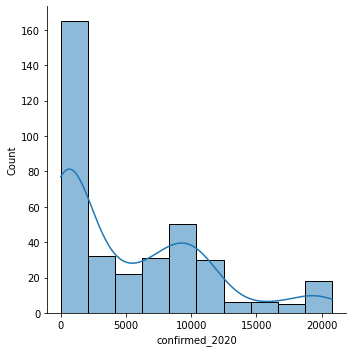

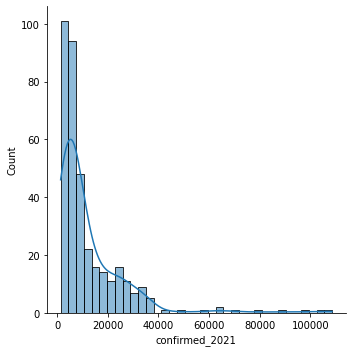

In [ ]:
sns.displot(data=yearly_df, x="confirmed_2020", kde=True)
sns.displot(data=yearly_df, x="confirmed_2021", kde=True)
plt.show()

Lambda: -0.143090


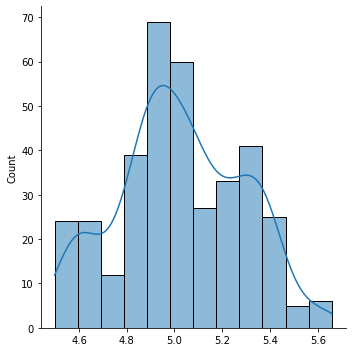

In [41]:
from scipy.stats import boxcox

# log_series = np.log(1+yearly_df['confirmed_2021'])
boxcox_series, lmbda = boxcox(yearly_df['confirmed_2021'])
print('Lambda: %f' % lmbda)
sns.displot(data=boxcox_series, kde=True)
# plt.plot(boxcox_series)

## COVID by Sex and Age

In [42]:
age_sex_df = df.copy()
# drop 'NC' from sexo and grupo_edad columns
age_sex_df = age_sex_df[(age_sex_df['Sexo']!='NC')&(age_sex_df['Edad']!='NC')]

def plot_histogram_covid_cases():
    fig = px.histogram(age_sex_df, x='Edad', y='num_casos',color='Sexo',barmode='group',text_auto='.2s')
    fig.update_layout(title_text="Número de casos COVID en España")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Grupos de edad')

    fig.update_layout(
            autosize=False,
            width=600,
            height=400,
        )
        
    fig.show()

def plot_histogram_covid_deaths():
    fig = px.histogram(age_sex_df, x='Edad', y='num_def',color='Sexo',barmode='group',text_auto='.2s')
    fig.update_layout(title_text="Número defunciones COVID en España")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Grupos de edad')

    fig.update_layout(
            autosize=False,
            width=600,
            height=400,
        )
        
    fig.show()

# plot_histogram_covid_cases()
# plot_histogram_covid_deaths()

## Daily evolution (hospitalized and UCI cases)

In [43]:
def process_df_hostpital_rates(df, population):
    # drop NC records
    df_provs = df[df['provincia_iso']!='NC']
    # group df by province
    df_provs = df_provs.groupby(['fecha','Año', 'provincia_iso', 'Provincias']).sum()
    df_provs.reset_index(inplace=True)
    # add month index: if month is <7, index is 1, else index is 7
    df_provs['Mes'] = df_provs.fecha.dt.month.apply(lambda x: 1 if x<7 else 7)
    # group popoulation df by year month and province iso
    df_population = population.groupby(by=['Año', 'Mes', 'provincia_iso','Provincias']).sum()
    df_population.reset_index(inplace=True)
    # merge df_provs with df_population
    df_provs = df_provs.merge(df_population, left_on=['Año', 'Mes', 'provincia_iso', 'Provincias'], 
                    right_on=['Año', 'Mes', 'provincia_iso','Provincias'])

    return df_provs


df_provs = process_df_hostpital_rates(df, population)

def plot_hospital_rates(df_provs, PROVINCE):
    # initialize fig object
    fig = go.Figure()
    # select data by province and apply moving window
    df_prov = df_provs[df_provs['Provincias']==PROVINCE].groupby(by=['fecha']).sum()
    df_prov = df_prov.rolling(window=7).mean().dropna()

    # plot num_hosp, uci, def rates
    fig.add_trace(go.Scatter(x=df_prov.index, y=df_prov['num_hosp'], name='Hospitalizados'), 
        )	
    fig.add_trace(go.Scatter(x=df_prov.index, y=df_prov['num_uci'], name='UCI'), 
        )	    
    fig.add_trace(go.Scatter(x=df_prov.index, y=df_prov['num_def'], name='Fallecidos'), 
        )

    fig.update_layout(title_text=f"Tasas de Hospitalizaciones y casos en UCI en {PROVINCE}")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Fecha')

    fig.update_traces(hovertemplate=None)
    fig.update_layout(hovermode='x unified')

    fig.update_layout(
        autosize=False,
        width=500,
        height=300,
    )
    fig.show()
    
for prov_iso in df.Provincias.unique():
    plot_hospital_rates(df_provs,prov_iso)


In [16]:
def plot_hospitalized_uci_cases_spain():
    fig = go.Figure()
    #plot selected data (by province or total spain data)
    fig.add_trace(go.Scatter(x=spain_df.index, y=spain_df['num_hosp'], name='Hospitalizados'))
    fig.add_trace(go.Scatter(x=spain_df.index, y=spain_df['num_uci'], name='UCI'))
    fig.add_trace(go.Scatter(x=spain_df.index, y=spain_df['num_def'], name='Defunciones'))

    fig.update_layout(title_text="Hospitalizaciones y casos en UCI en España")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Fecha')

    fig.update_traces(hovertemplate=None)
    fig.update_layout(hovermode='x unified')

    fig.update_layout(
        autosize=False,
        width=500,
        height=300,
    )
    fig.show()

plot_hospitalized_uci_cases_spain()

In [ ]:
def plot_hospitalized_uci_cases_spain():
    fig = go.Figure()
    #plot selected data (by province or total spain data)
    fig.add_trace(go.Scatter(x=spain_df.index, y=spain_df['num_hosp'], name='Hospitalizados'))
    fig.add_trace(go.Scatter(x=spain_df.index, y=spain_df['num_uci'], name='UCI'))
    fig.add_trace(go.Scatter(x=spain_df.index, y=spain_df['num_def'], name='Defunciones'))

    fig.update_layout(title_text="Hospitalizaciones y casos en UCI en España")
    fig.update_yaxes(title_text='Casos')
    fig.update_xaxes(title_text='Fecha')

    fig.update_traces(hovertemplate=None)
    fig.update_layout(hovermode='x unified')

    fig.update_layout(
        autosize=False,
        width=500,
        height=300,
    )
    fig.show()

plot_hospitalized_uci_cases_spain()

In [22]:
def plot_covid_evolution_by_province(PROVINCE):
    df_prov = df[df['Provincias']==PROVINCE].groupby(by=['fecha']).sum()
    df_prov = df_prov.rolling(window=7).mean().dropna()

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df_prov.index, y=df_prov['num_hosp'], name='Hospitalizados'), 
        )	
    fig.add_trace(go.Scatter(x=df_prov.index, y=df_prov['num_uci'], name='UCI'), 
        )	    
    fig.add_trace(go.Scatter(x=df_prov.index, y=df_prov['num_def'], name='Fallecidos'), 
        )

    fig.update_layout(title_text=f"Hospitalizaciones y casos en UCI en {PROVINCE}")
    fig.update_yaxes(title_text='Casos', range=[0, df.num_hosp.max()])
    fig.update_xaxes(title_text='Fecha')

    fig.update_traces(hovertemplate=None)
    fig.update_layout(hovermode='x unified')

    fig.update_layout(
        autosize=False,
        width=500,
        height=300,
    )

    fig.show()

In [25]:
for province in df.Provincias.unique():
    plot_covid_evolution_by_province(province)


# Plot monthly cases
The purpose now is to show the rate of new cases, hospitalized, uci and def by province. 

In [ ]:
df_monthly_mean_cases = df_provs.groupby(['provincia_iso', 'Año', 'Mes', 'Total']).mean().reset_index()
for curve in ['num_casos', 'num_hosp', 'num_uci', 'num_def']:
    df_monthly_mean_cases[curve] = df_monthly_mean_cases[curve]
    df_monthly_mean_cases[f'{curve}_rate'] = df_monthly_mean_cases[curve]/df_monthly_mean_cases['Total']
df_monthly_mean_cases = df_monthly_mean_cases.merge(iso, left_on='provincia_iso', right_on='code', how='left')

In [ ]:
def plot_covid_rates_by_province_by_year():

    fig = go.Figure()

    fig.add_trace(go.Bar(x=df_monthly_mean_cases[df_monthly_mean_cases['Año']==2020]['name'], 
        y=df_monthly_mean_cases[df_monthly_mean_cases['Año']==2020]['num_def_rate'], 
        name='2020', marker_color='#696969'))
    fig.add_trace(go.Bar(x=df_monthly_mean_cases[df_monthly_mean_cases['Año']==2021]['name'], 
        y=df_monthly_mean_cases[df_monthly_mean_cases['Año']==2021]['num_def_rate'], 
        name='2021', marker_color='#A9A9A9'))

    fig.update_layout(title_text="Tasa de defunciones COVID en España")
    fig.update_yaxes(title_text='Tasa')
    fig.update_xaxes(title_text='Provincias')

    fig.update_layout(
            autosize=False,
            width=1000,
            height=400,
        )
    fig.update_layout(barmode='group', xaxis_tickangle=-45)        
    fig.show()
plot_covid_rates_by_province_by_year()